<a href="https://colab.research.google.com/github/Samuel-Mason-git/Recent-Projects/blob/main/Multi_Label_Fruit_Image_Classification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!kaggle datasets download -d karimabdulnabi/fruit-classification10-class
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from PIL import Image
import numpy
import tensorflow as tf
from numpy import asarray
import zipfile
with zipfile.ZipFile('/content/fruit-classification10-class.zip', 'r') as zip_ref:
    zip_ref.extractall()

Dataset URL: https://www.kaggle.com/datasets/karimabdulnabi/fruit-classification10-class
License(s): CC0-1.0
 96% 28.0M/29.2M [00:01<00:00, 35.3MB/s]
100% 29.2M/29.2M [00:01<00:00, 23.7MB/s]


In [2]:
!nvidia-smi

Sun May 12 09:13:47 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   45C    P8               9W /  70W |      0MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

## Extracting the jpegs into a numerical format and storing in lists for X_test, X_train, y_test and y_train
1. Unzip the files in the directory
2. Pull out and run each Jpeg file through a function to return a numerical list value for the images
3. Store in Lists which will be converted to Arrays later

In [3]:
from pathlib import Path
from PIL import Image
import numpy as np

directory_test = '/content/MY_data/test'
directory_train = '/content/MY_data/train'

test_file_paths = list(Path(directory_test).glob('*'))
train_file_paths = list(Path(directory_train).glob('*'))

def array_image(jpeg, target_size=(50, 50)):
    img = Image.open(jpeg)
    img_resized = img.resize(target_size, Image.ANTIALIAS)
    img_padded = Image.new("RGB", target_size)
    img_padded.paste(img_resized, (0, 0))
    np_img = np.array(img_padded)
    return np_img

X_train = []
y_train = []
X_test = []
y_test = []


for path in train_file_paths:
    label = Path(path).stem
    files = list(Path(path).glob('*.jpeg'))
    for file in files:
      np_img = array_image(file)
      X_train.append(np_img)
      y_train.append(label)

for path in test_file_paths:
    label = Path(path).stem
    files = list(Path(path).glob('*.jpeg'))
    for file in files:
      np_img = array_image(file)
      X_test.append(np_img)
      y_test.append(label)


<ipython-input-3-6f6ee6ce02ba>:13: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  img_resized = img.resize(target_size, Image.ANTIALIAS)


## Understand the shape of our Data
1. Convert all data into NumPy arrays
2. Understand the shape of our data
3. Understand the shape of each element
4. Understand what labels we have

In [4]:
X_train = np.array(X_train)
X_test = np.array(X_test)
y_train = np.array(y_train)
y_test = np.array(y_test)
from sklearn.utils import shuffle

X_train, y_train = shuffle(X_train, y_train, random_state=42)
X_test, y_test = shuffle(X_test, y_test, random_state=42)

print(X_train.shape, y_train.shape, X_test.shape, y_test.shape)

print(X_train[0].shape)
print(X_test[0].shape)
print(X_train[1].shape)
print(X_test[1].shape)

y_train = [value.lower() for value in y_train]
y_test = [value.lower() for value in y_test]


print('Unique Labels: ', np.unique(y_train))


old_name = 'stawberries'
new_name = 'strawberries'
y_test = np.array([new_name if label == old_name else label for label in y_test])

class_labels = np.unique(y_train)
test_labels = np.unique(y_test)
print('Unique Labels: ', test_labels)
if np.array_equal(class_labels, test_labels):
  print('All labels are equal')
  print(f'Number of unique labels: {len(class_labels)}')
else:
  print('There is a missmatch with the labels between y_train and y_test')



(2301, 50, 50, 3) (2301,) (1025, 50, 50, 3) (1025,)
(50, 50, 3)
(50, 50, 3)
(50, 50, 3)
(50, 50, 3)
Unique Labels:  ['apple' 'avocado' 'banana' 'cherry' 'kiwi' 'mango' 'orange' 'pinenapple'
 'strawberries' 'watermelon']
Unique Labels:  ['apple' 'avocado' 'banana' 'cherry' 'kiwi' 'mango' 'orange' 'pinenapple'
 'strawberries' 'watermelon']
All labels are equal
Number of unique labels: 10


### Randomly generate a subplot of four images and their corresponding labels to have an overview that extraction has worked correctly

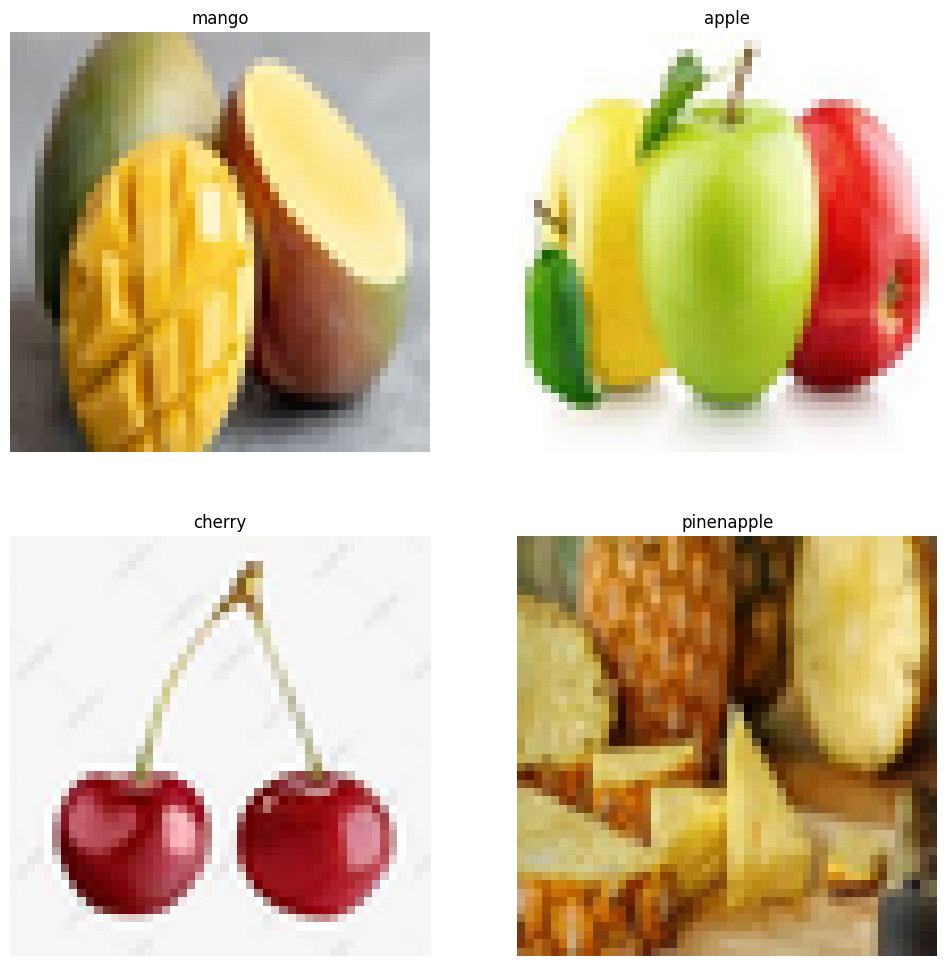

In [5]:
import random
plt.figure(figsize=(12, 12))
for i in range(4):
  ax = plt.subplot(2, 2, i + 1)
  rand_index = random.randint(0, (len(X_train)-1))
  plt.imshow(X_train[rand_index], cmap=plt.cm.binary)
  plt.title(y_train[rand_index])
  plt.axis(False)

## Normalise the image's for better model performance
1. Divide the training data by the maximum number in order to normalise between 0 and 1
2. One hot encode our labels in order to pass a numerical array as the predictor to the model

In [6]:
from sklearn.preprocessing import LabelBinarizer

X_train.min(),

X_train_norm = X_train / X_train.max()
X_test_norm = X_test / X_test.max()

# Check the min and max values of the training data
X_train_norm.min(), X_test_norm.max()

label_binarizer = LabelBinarizer()
label_binarizer.fit(class_labels)
y_train_encoded = label_binarizer.transform(y_train)
y_test_encoded = label_binarizer.transform(y_test)
print("Shape of y_train_encoded:", y_train_encoded.shape)
print("Shape of y_test_encoded:", y_test_encoded.shape)

Shape of y_train_encoded: (2301, 10)
Shape of y_test_encoded: (1025, 10)


### Check one hot encoding was successful
1. y_test highlighted that it had an error for its labelling with a spelling mistake for strawberries
2. This was fixed and now all labels are correctly one-hot-encoded

In [7]:
for i in range(0,len(y_test),100):
    print("Label at index", i, ":", list(y_test_encoded[i]))

print("Class labels:", class_labels)

for i, label in enumerate(y_test_encoded):
    if sum(label) != 1:
        print("Label at index", i, "is not properly one-hot encoded:", label)

for i, label in enumerate(y_train_encoded):
    if sum(label) != 1:
        print("Label at index", i, "is not properly one-hot encoded:", label)


Label at index 0 : [0, 0, 0, 1, 0, 0, 0, 0, 0, 0]
Label at index 100 : [0, 0, 0, 0, 0, 0, 0, 0, 1, 0]
Label at index 200 : [0, 0, 1, 0, 0, 0, 0, 0, 0, 0]
Label at index 300 : [0, 1, 0, 0, 0, 0, 0, 0, 0, 0]
Label at index 400 : [0, 1, 0, 0, 0, 0, 0, 0, 0, 0]
Label at index 500 : [0, 0, 0, 0, 0, 0, 0, 0, 1, 0]
Label at index 600 : [0, 0, 0, 0, 0, 0, 1, 0, 0, 0]
Label at index 700 : [0, 0, 0, 0, 1, 0, 0, 0, 0, 0]
Label at index 800 : [0, 0, 0, 0, 0, 1, 0, 0, 0, 0]
Label at index 900 : [0, 1, 0, 0, 0, 0, 0, 0, 0, 0]
Label at index 1000 : [0, 0, 0, 0, 0, 1, 0, 0, 0, 0]
Class labels: ['apple' 'avocado' 'banana' 'cherry' 'kiwi' 'mango' 'orange' 'pinenapple'
 'strawberries' 'watermelon']


## Creating our model

In [8]:
print(X_train_norm.shape)
print(y_train_encoded.shape)

(2301, 50, 50, 3)
(2301, 10)


In [9]:
tf.random.set_seed(42)

# Create the model
model = tf.keras.Sequential([
  tf.keras.layers.Flatten(input_shape=(50, 50, 3)),
  tf.keras.layers.Dense(256, activation="relu"),
  tf.keras.layers.Dense(128, activation="relu"),
  tf.keras.layers.Dense(len(class_labels), activation="softmax")
])

In [10]:
model.compile(loss=tf.keras.losses.CategoricalCrossentropy(),
                 optimizer=tf.keras.optimizers.SGD(learning_rate=0.001),
                 metrics=["accuracy"])

In [11]:
history = model.fit(X_train_norm, y_train_encoded, epochs=500, batch_size=50, validation_data=(X_test_norm, y_test_encoded))

Epoch 1/500
47/47 [==============================] - 3s 14ms/step - loss: 2.3215 - accuracy: 0.1143 - val_loss: 2.3058 - val_accuracy: 0.1024
Epoch 2/500
47/47 [==============================] - 0s 6ms/step - loss: 2.2564 - accuracy: 0.1612 - val_loss: 2.3009 - val_accuracy: 0.1063
Epoch 3/500
47/47 [==============================] - 0s 9ms/step - loss: 2.2134 - accuracy: 0.2017 - val_loss: 2.4120 - val_accuracy: 0.1083
Epoch 4/500
47/47 [==============================] - 0s 6ms/step - loss: 2.1945 - accuracy: 0.1977 - val_loss: 2.4165 - val_accuracy: 0.1132
Epoch 5/500
47/47 [==============================] - 0s 6ms/step - loss: 2.1689 - accuracy: 0.2160 - val_loss: 2.3060 - val_accuracy: 0.1268
Epoch 6/500
47/47 [==============================] - 0s 7ms/step - loss: 2.1364 - accuracy: 0.2355 - val_loss: 2.1637 - val_accuracy: 0.1893
Epoch 7/500
47/47 [==============================] - 0s 9ms/step - loss: 2.1054 - accuracy: 0.2573 - val_loss: 2.1469 - val_accuracy: 0.1980
Epoch 8/500


### Checking our model performance over time

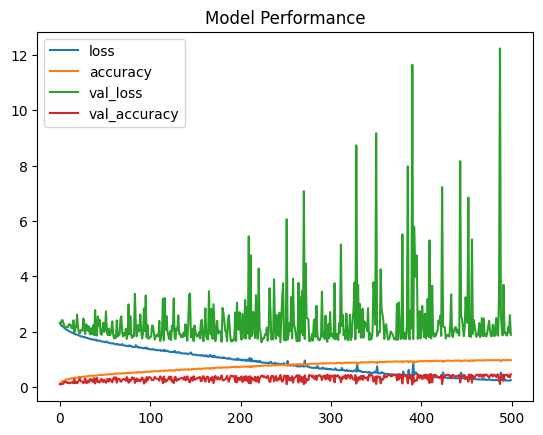

In [12]:
import pandas as pd
pd.DataFrame(history.history).plot(title="Model Performance");

## Creating a confusion matrix to check our true values against predicted values

In [15]:
import itertools
from sklearn.metrics import confusion_matrix

def make_confusion_matrix(y_true, y_pred, classes=None, figsize=(10, 10), text_size=15):

  # Create the confusion matrix
  cm = confusion_matrix(y_true, y_pred)
  cm_norm = cm.astype("float") / cm.sum(axis=1)[:, np.newaxis] # normalize it
  n_classes = cm.shape[0] # find the number of classes we're dealing with

  # Plot the figure and make it pretty
  fig, ax = plt.subplots(figsize=figsize)
  cax = ax.matshow(cm, cmap=plt.cm.Blues) # colors will represent how 'correct' a class is, darker == better
  fig.colorbar(cax)

  # Are there a list of classes?
  if classes is not None and len(classes) > 0:
    labels = classes
  else:
    labels = np.arange(cm.shape[0])

  # Label the axes
  ax.set(title="Confusion Matrix",
         xlabel="Predicted label",
         ylabel="True label",
         xticks=np.arange(n_classes), # create enough axis slots for each class
         yticks=np.arange(n_classes),
         xticklabels=labels, # axes will labeled with class names (if they exist) or ints
         yticklabels=labels)

  # Make x-axis labels appear on bottom
  ax.xaxis.set_label_position("bottom")
  ax.xaxis.tick_bottom()

  # Set the threshold for different colors
  threshold = (cm.max() + cm.min()) / 2.

  # Plot the text on each cell
  for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
    plt.text(j, i, f"{cm[i, j]} ({cm_norm[i, j]*100:.1f}%)",
             horizontalalignment="center",
             color="white" if cm[i, j] > threshold else "black",
             size=text_size)


33/33 [==============================] - 0s 7ms/step


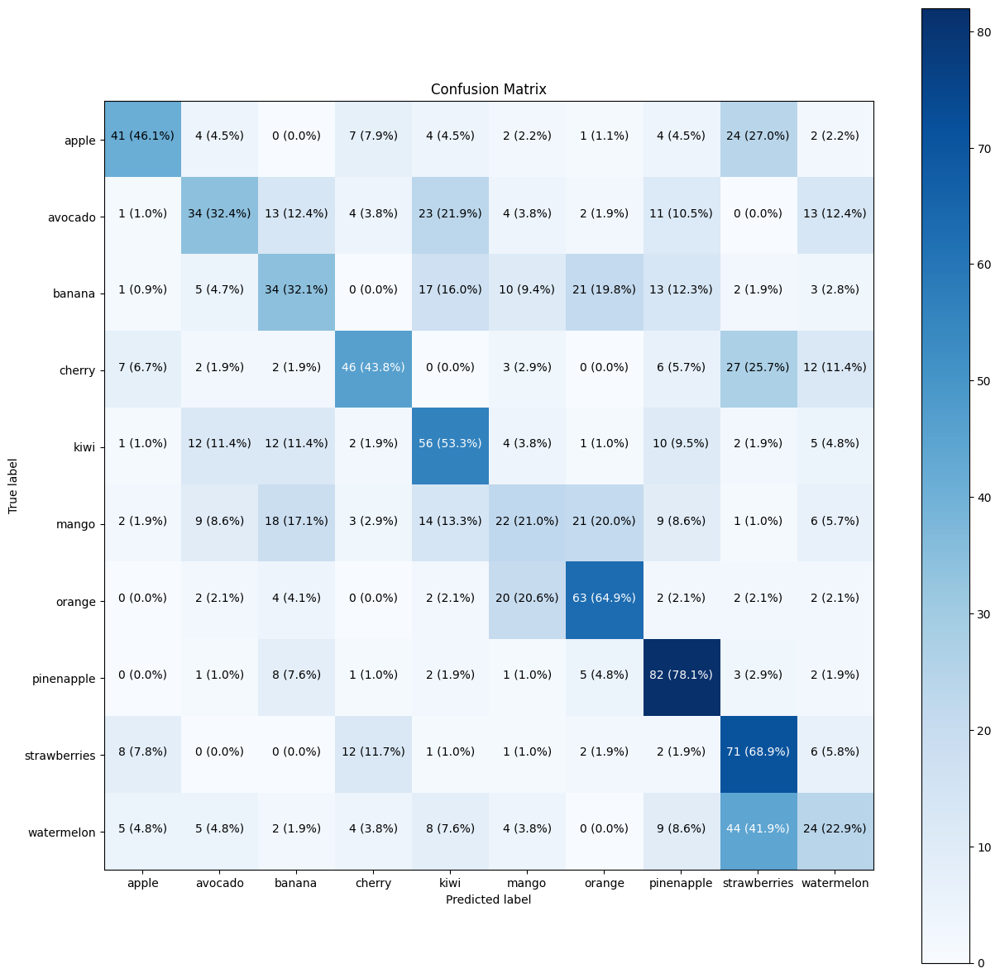

In [18]:

y_true_encoded = label_binarizer.transform(y_test)
y_true_numerical = np.argmax(y_true_encoded, axis=1)

# Make predictions with the most recent model
y_probs = model.predict(X_test_norm) # "probs" is short for probabilities
y_preds = y_probs.argmax(axis=1)


from sklearn.metrics import confusion_matrix
confusion_matrix(y_true=y_true_numerical,
                 y_pred=y_preds)

make_confusion_matrix(y_true=y_true_numerical,
                      y_pred=y_preds,
                      classes=class_labels,
                      figsize=(15, 15),
                      text_size=10)

## Predicting using the 'Predict' images to see how successful the model is
1. Convert images to numerical format and resize
2. Convert to an array
3. Divide by the max value to normalise

In [28]:
prediction_images = list(Path('/content/MY_data/predict').glob('*'))
prediction_images_np = []

for jpeg in prediction_images:
  np_img = array_image(jpeg)
  prediction_images_np.append(np_img)

prediction_images_np = np.asarray(prediction_images_np)
prediction_images_np_norm = prediction_images_np / prediction_images_np.max()

print(prediction_images_np_norm.min(), prediction_images_np_norm.max())

0.0 1.0


<ipython-input-3-6f6ee6ce02ba>:13: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  img_resized = img.resize(target_size, Image.ANTIALIAS)


In [29]:
predictions = model.predict(prediction_images_np_norm)
predicted_labels = tf.argmax(predictions, axis=1)

2/2 [==============================] - 0s 36ms/step


## Predicting the images in the predict file and displaying the predicted label as the plot title

/content/MY_data/predict/img_01.jpeg


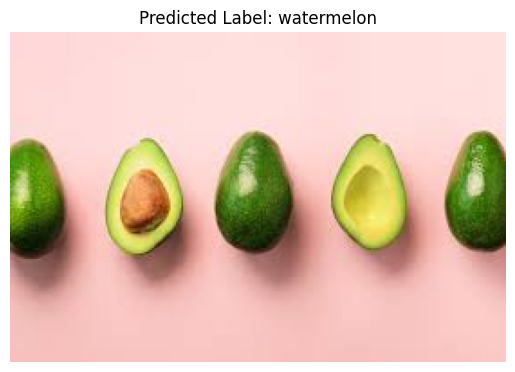

/content/MY_data/predict/22.jpeg


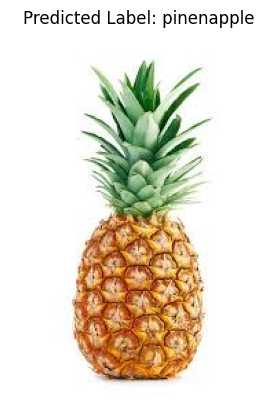

/content/MY_data/predict/f5.jpeg


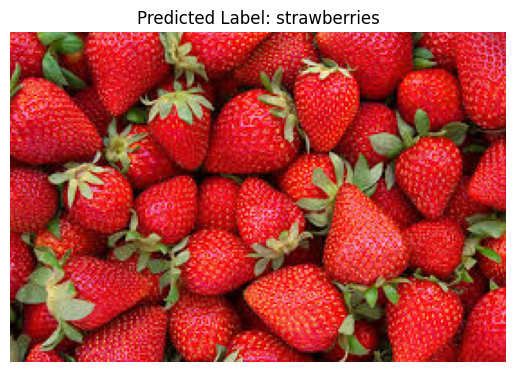

/content/MY_data/predict/0.jpeg


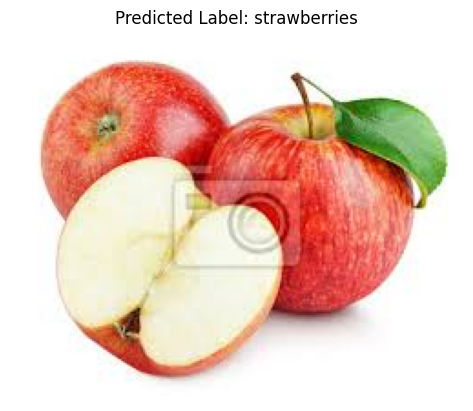

/content/MY_data/predict/147.jpeg


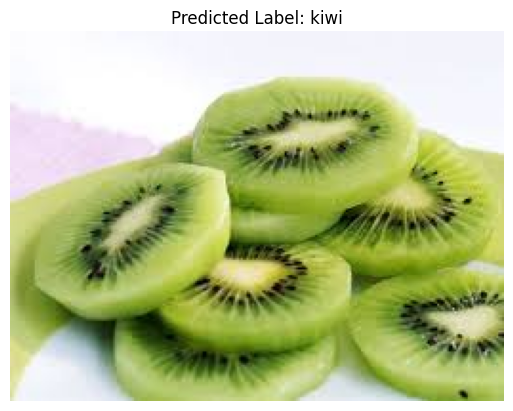

/content/MY_data/predict/00.jpeg


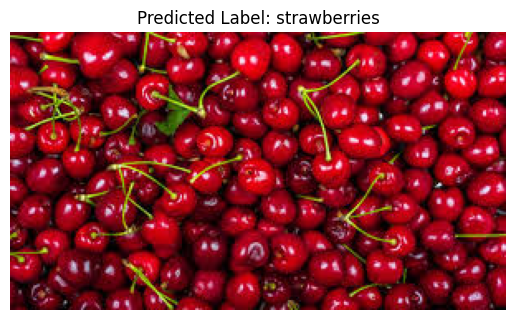

/content/MY_data/predict/f2.jpeg


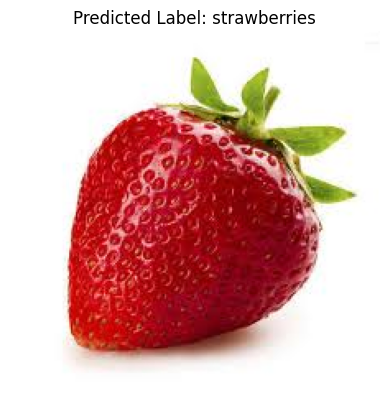

/content/MY_data/predict/65.jpeg


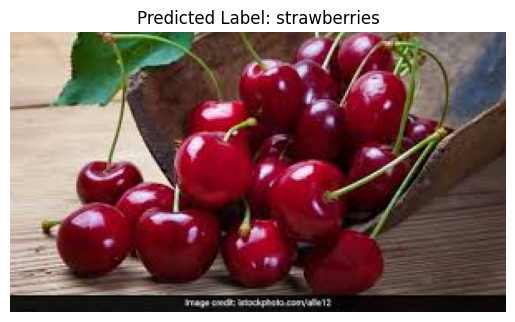

/content/MY_data/predict/2.jpeg


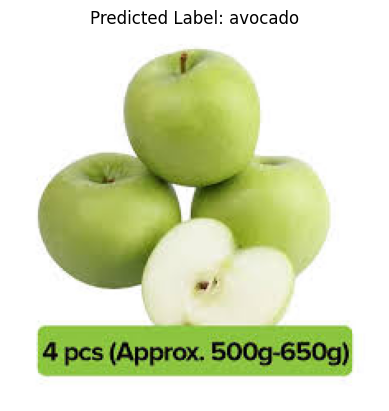

/content/MY_data/predict/011.jpeg


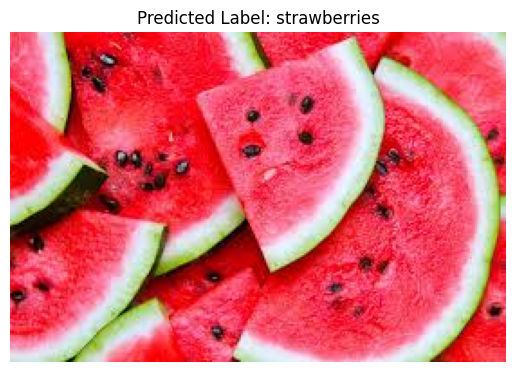

/content/MY_data/predict/img_301.jpeg


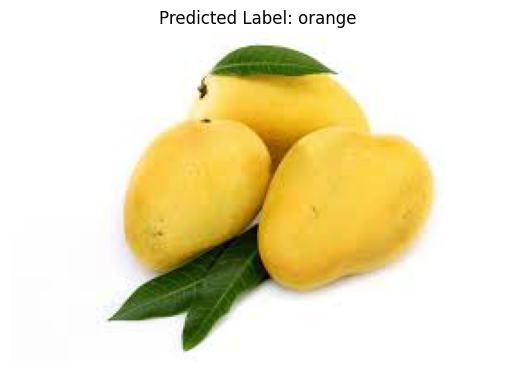

/content/MY_data/predict/68.jpeg


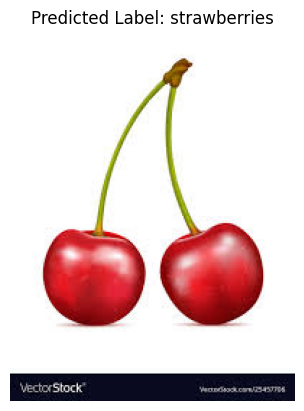

/content/MY_data/predict/img_361.jpeg


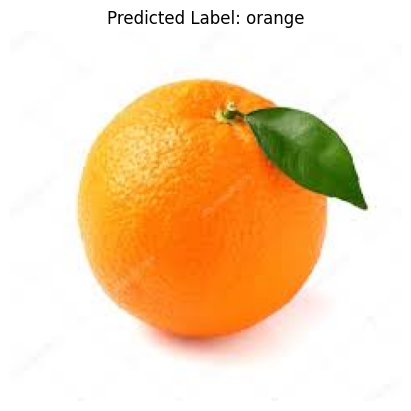

/content/MY_data/predict/365.jpeg


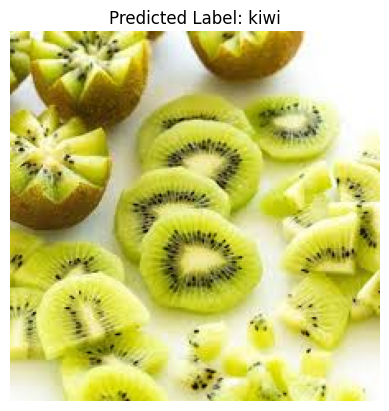

/content/MY_data/predict/img_191.jpeg


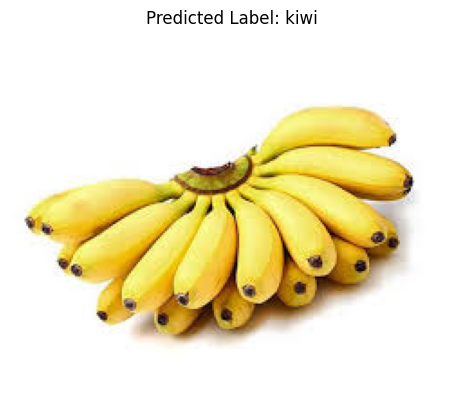

/content/MY_data/predict/img_31.jpeg


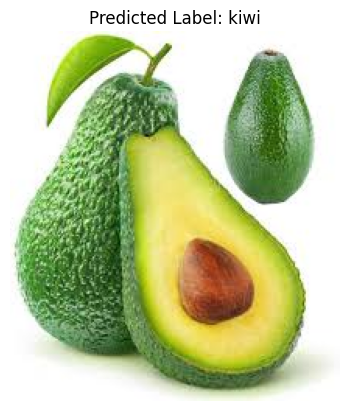

/content/MY_data/predict/img_141.jpeg


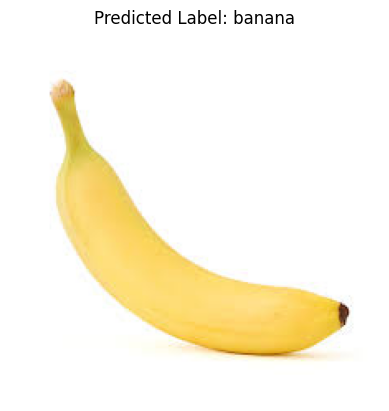

/content/MY_data/predict/0122.jpeg


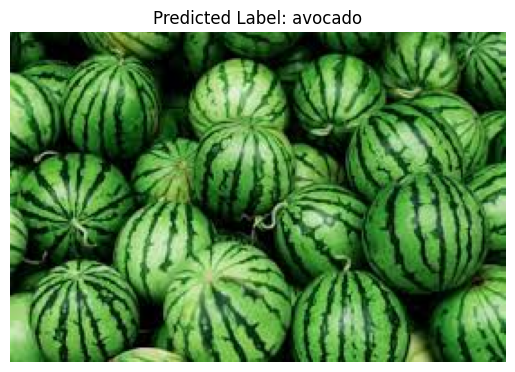

/content/MY_data/predict/77.jpeg


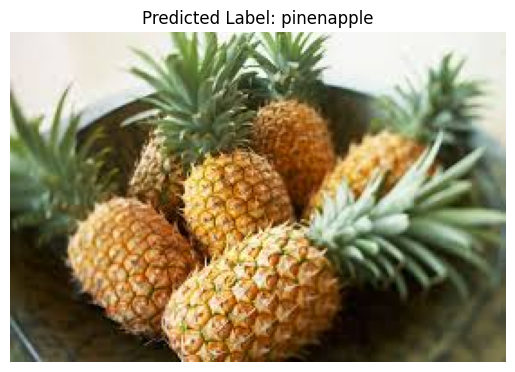

/content/MY_data/predict/0124.jpeg


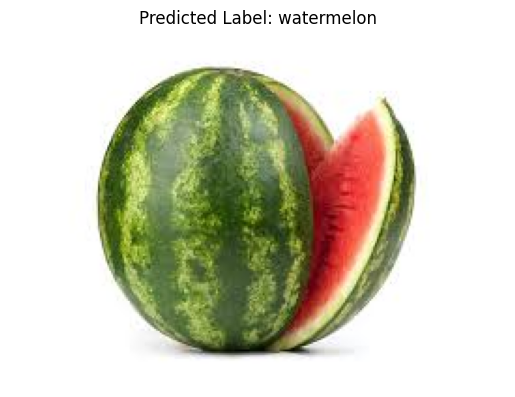

/content/MY_data/predict/img_21.jpeg


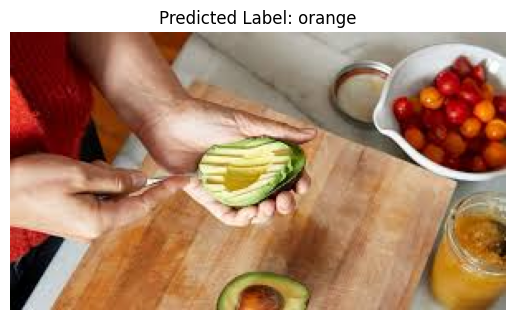

/content/MY_data/predict/41.jpeg


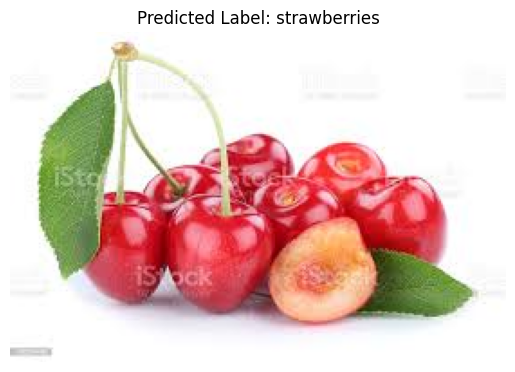

/content/MY_data/predict/img_411.jpeg


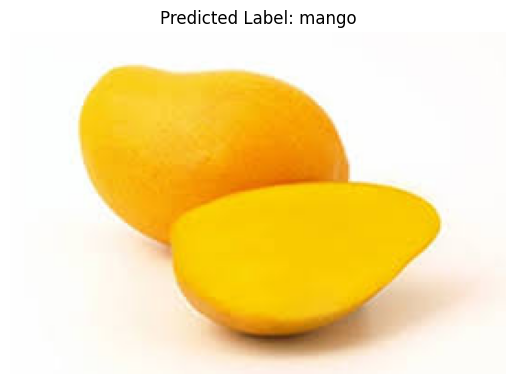

/content/MY_data/predict/img_121.jpeg


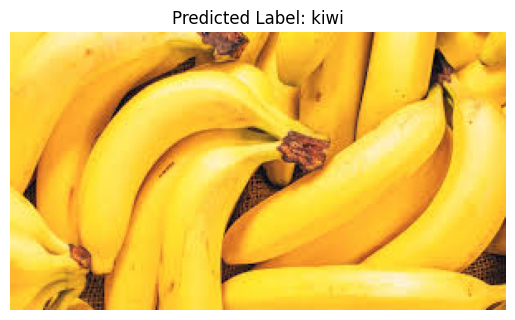

/content/MY_data/predict/4.jpeg


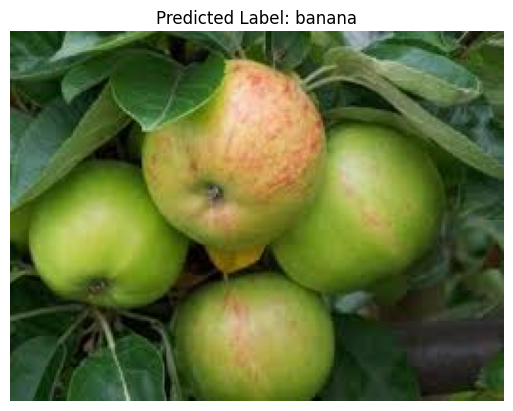

/content/MY_data/predict/1.jpeg


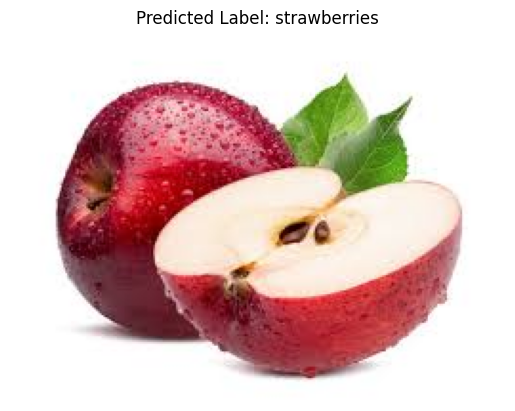

/content/MY_data/predict/img_11.jpeg


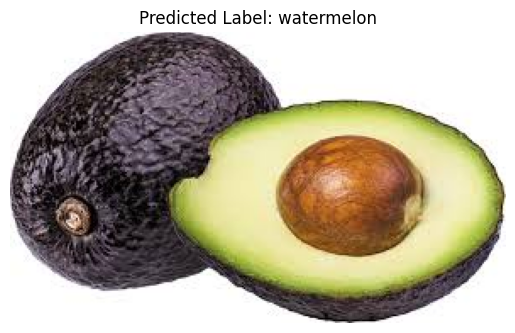

/content/MY_data/predict/321.jpeg


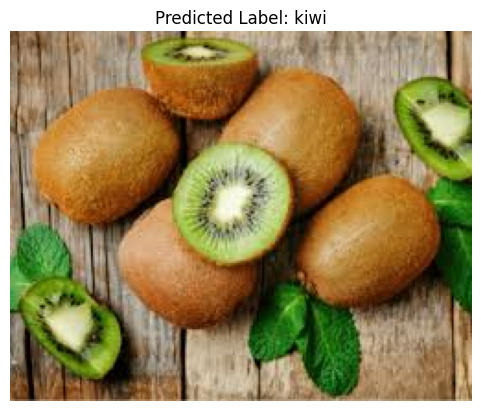

/content/MY_data/predict/023.jpeg


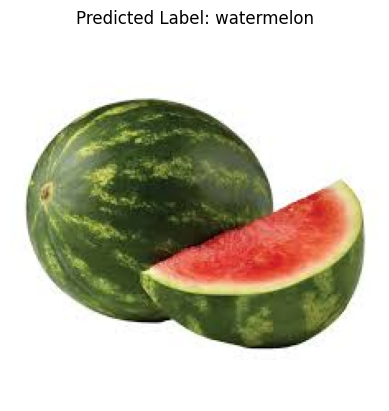

/content/MY_data/predict/33.jpeg


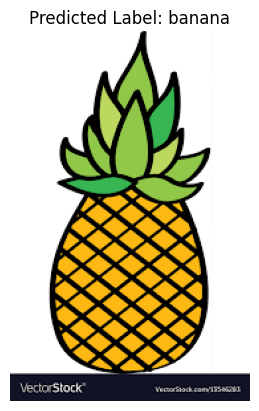

/content/MY_data/predict/99.jpeg


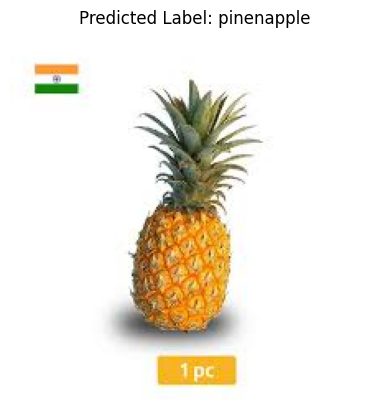

/content/MY_data/predict/3.jpeg


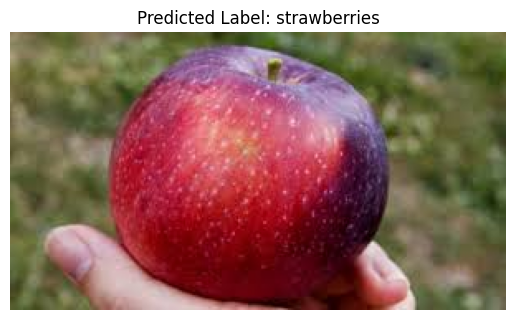

/content/MY_data/predict/202.jpeg


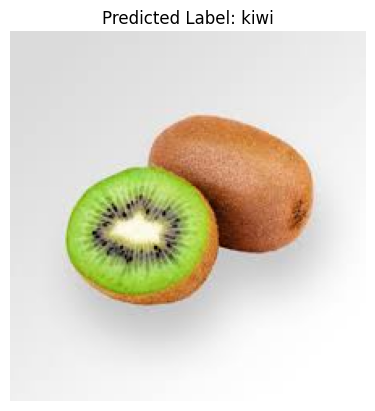

/content/MY_data/predict/f1.jpeg


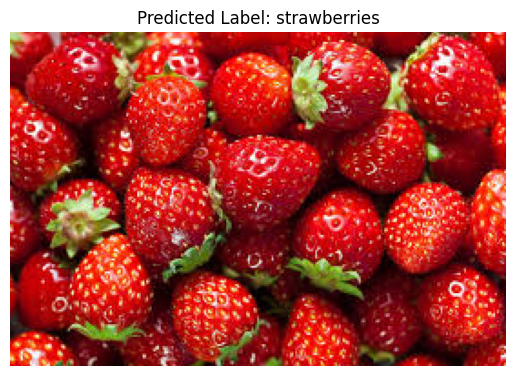

/content/MY_data/predict/img_241.jpeg


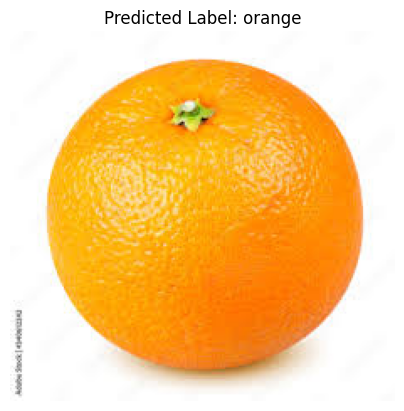

/content/MY_data/predict/img_41.jpeg


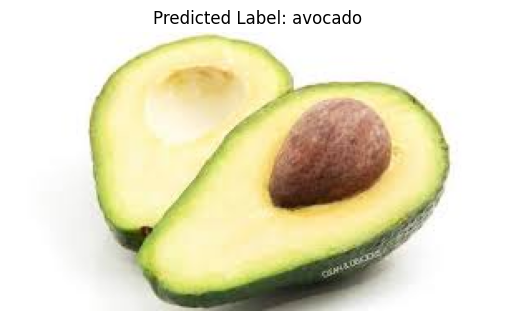

/content/MY_data/predict/img_371.jpeg


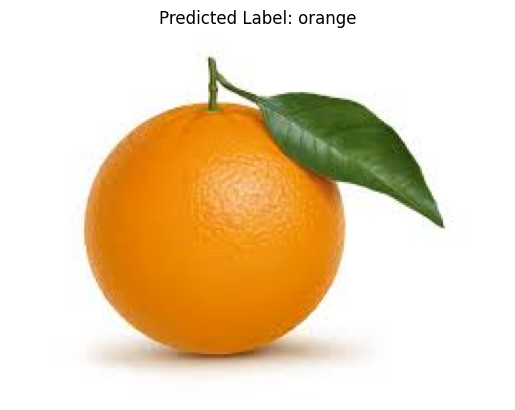

/content/MY_data/predict/img_171.jpeg


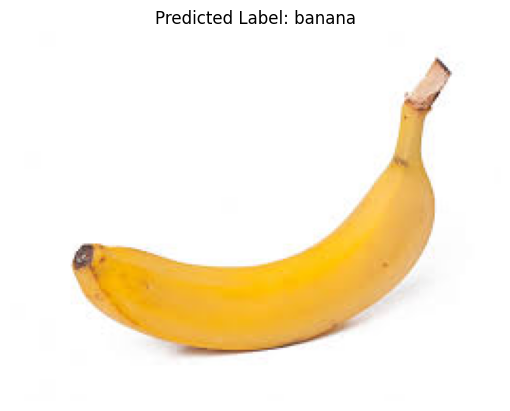

/content/MY_data/predict/f0.jpeg


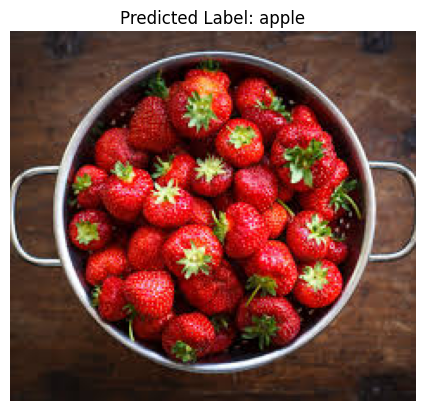

/content/MY_data/predict/659.jpeg


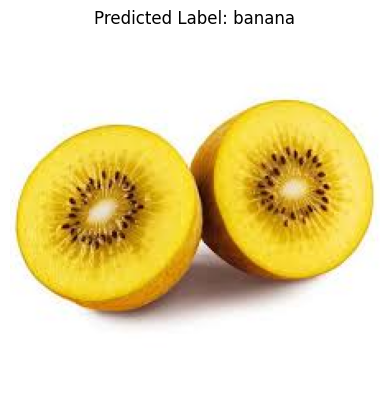

/content/MY_data/predict/img_401.jpeg


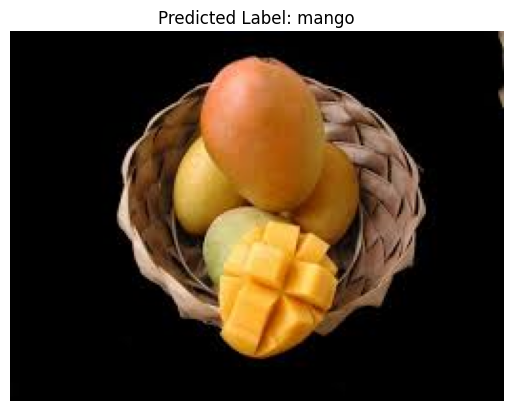

/content/MY_data/predict/9.jpeg


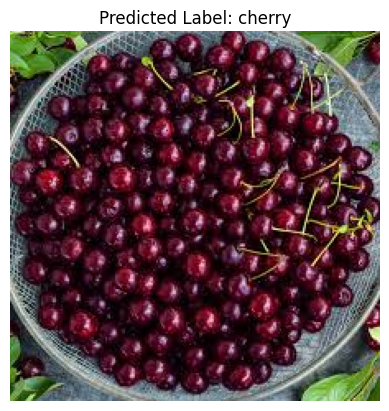

/content/MY_data/predict/img_421.jpeg


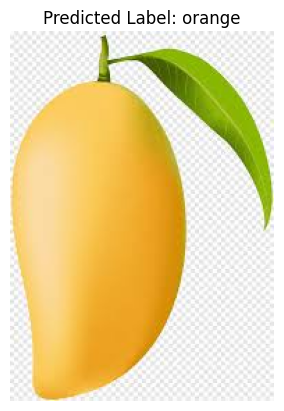

/content/MY_data/predict/img_341.jpeg


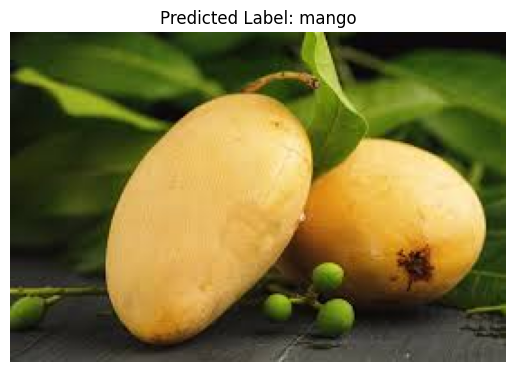

/content/MY_data/predict/f7.jpeg


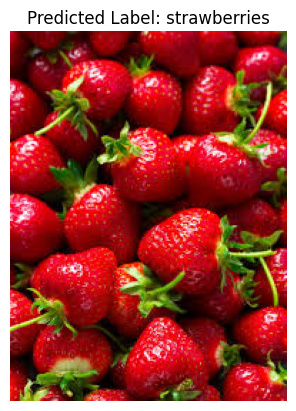

/content/MY_data/predict/66.jpeg


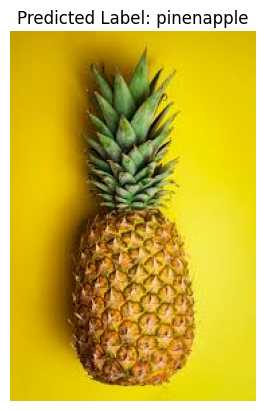

/content/MY_data/predict/012.jpeg


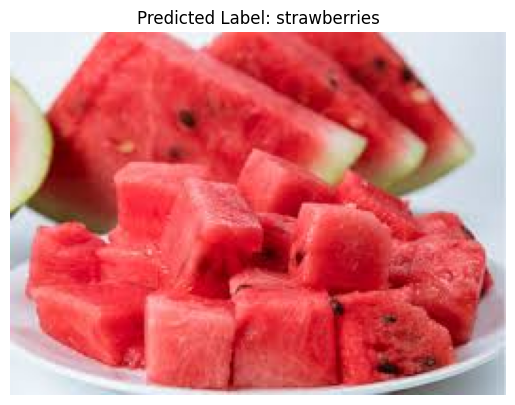

/content/MY_data/predict/img_381.jpeg


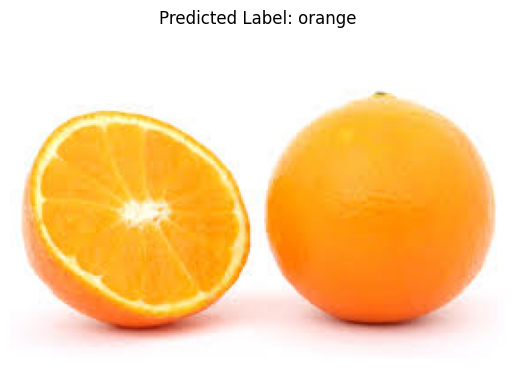

In [37]:
for image, label in zip(prediction_images, predicted_labels):
    print(image)
    image = Image.open(image)
    plt.imshow(image)
    plt.title(f'Predicted Label: {class_labels[label]}')
    plt.axis('off')
    plt.show()